In [1]:
import os
import glob
import pysam
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

In [64]:
PATH_TO_JOANITO_ADATA           = '/node200data/18parkky/datasets/data/public/processed_data/CRC_MSI_intensity_analysis_clean_data/adata_j.preprocessed.NanoMnT.h5ad'
PATH_TO_JOANITO_METADATA2       = '/node200data/18parkky/datasets/data/public/processed_data/Joanito_et_al/CRC-SG1/synapse-metadata/patient_clinical_information.csv'
PATH_TO_JOANITO_ALLELETABLE     = '/node200data/18parkky/datasets/data/public/processed_data/CRC_MSI_intensity_analysis_clean_data/NanoMnT.AlleleTable.Joanito_et_al.tsv.gz'
PATH_TO_JOANITO_SG1_METADATA    = '/node200data/18parkky/datasets/data/public/processed_data/Joanito_et_al/CRC-SG1/EGAD00001008555-metadata/organized_metadata.tsv'
PATH_TO_JOANITO_KUL_METADATA    = '/node200data/18parkky/datasets/data/public/processed_data/Joanito_et_al/KUL/organized_metadata.tsv'

PATH_SCMSI_SCORE    = '/home/18parkky/git/CRC_MSI_intensity_analysis/scMSI-score.py'
PATH_SCMSI_FIND     = '/home/18parkky/git/CRC_MSI_intensity_analysis/scMSI-find.py'

DIR_OUT = '/node200data/18parkky/datasets/data/public/processed_data/CRC_MSI_intensity_analysis_clean_data'

In [3]:
joanito_metadata = pd.read_csv(PATH_TO_JOANITO_METADATA2, encoding="ISO-8859-1")
joanito_metadata = joanito_metadata[joanito_metadata['dataset'].isin(['CRC-SG1', 'KUL5', 'KUL3'])].copy()

dict_PatientID_to_MSIstatus  = { list(tup)[2] : tup.MSS_MSI for tup in joanito_metadata.itertuples() }

adata = sc.read_h5ad(PATH_TO_JOANITO_ADATA)
adata.obs['MSI_status'] = [ dict_PatientID_to_MSIstatus[PatientID] for PatientID in adata.obs['PatientID'] ]

## Visualize MSI score with UMAP (Fig. 2a)

In [4]:
adata_MSI = adata[adata.obs['NumSTRLoci']>=10].copy()
u, s = np.mean(adata_MSI.obs['MSI_score']), np.std(adata_MSI.obs['MSI_score'])
adata_MSI.obs['MSI_z_score'] = [ (score-u)/s for score in adata_MSI.obs['MSI_score'] ]

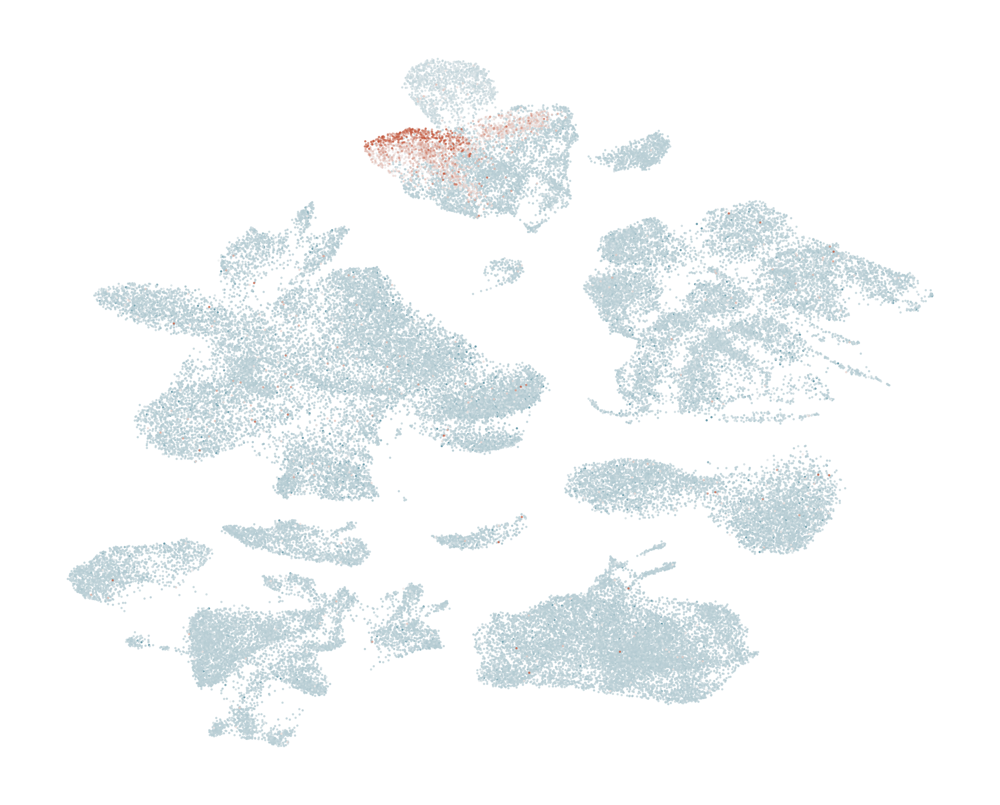

In [5]:
with plt.rc_context({"figure.dpi": (600), 'figure.figsize':(5, 4)}):
    sc.pl.umap(adata_MSI, color=['MSI_score',], 
            ncols=2,
            cmap=sns.diverging_palette(220, 20, as_cmap=True),
            vmin=-5, vmax=10,
            colorbar_loc=None,
            frameon=False, 
            legend_loc=None,
            alpha=0.75, 
            # s=10,
            title='',
            )
plt.show()

## Visualize Author-annotations and Patient ID with UMAP (Extended Data Fig. 2a)

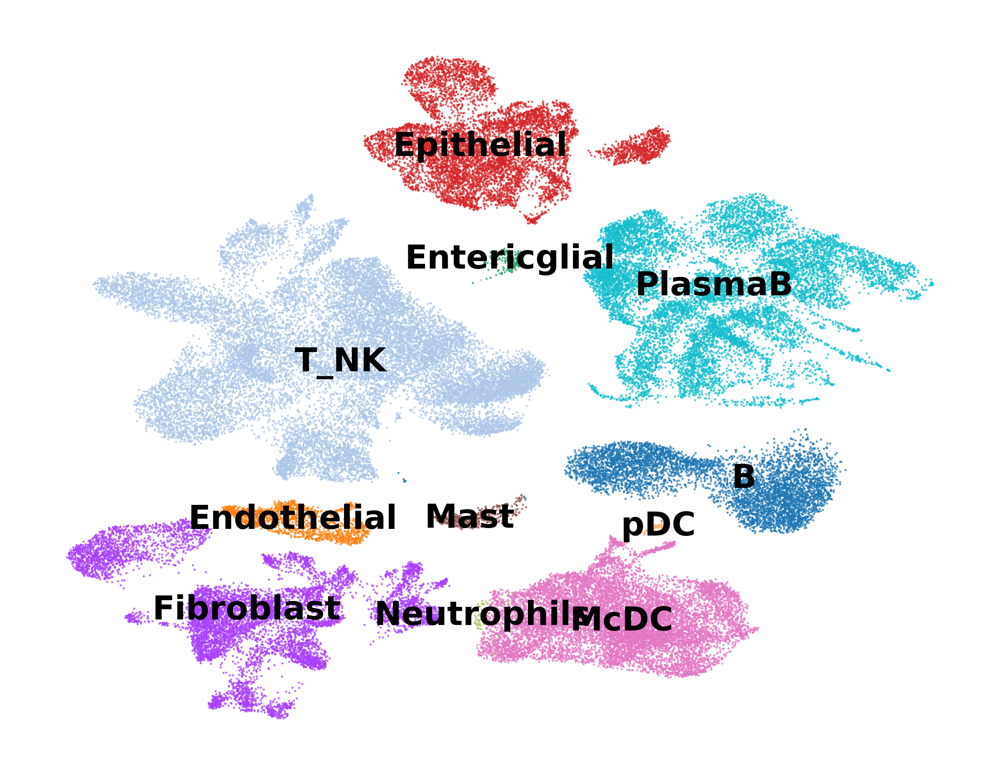

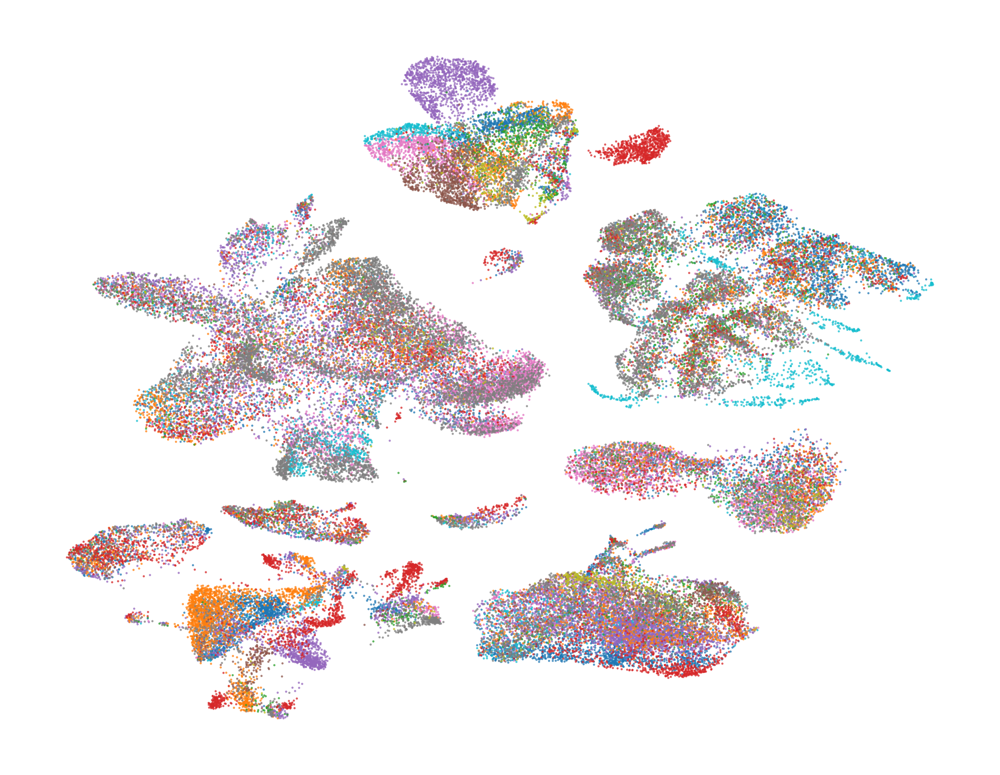

In [6]:
with plt.rc_context({"figure.dpi": (600), 'figure.figsize':(5.2, 4)}):
    sc.pl.umap(adata_MSI, color=['Author_CellType_lvl_1',], 
            ncols=2,
            frameon=False, 
            legend_loc='on data',
            alpha=0.75, 
            # s=10,
            title='',
            )
plt.show()

with plt.rc_context({"figure.dpi": (600), 'figure.figsize':(5.2, 4)}):
    sc.pl.umap(adata_MSI, color=['PatientID',], 
            ncols=2,
            frameon=False, 
            alpha=0.75,
            legend_loc=None, 
            # s=10,
            title='',
            )
plt.show()

## Epithelial subclustering

In [7]:
adata_epi = adata[(adata.obs['Author_CellType_lvl_1']=='Epithelial')].copy()
adata_epi = adata_epi.raw.to_adata()

In [8]:
onlySingleCellSample = list()
for SampleID, edf in adata_epi.obs.groupby("SampleID"):
    if len(edf) <= 1:
        print(SampleID)
        onlySingleCellSample.append(SampleID)
adata_epi = adata_epi[~(adata_epi.obs['SampleID'].isin(onlySingleCellSample))].copy()

/tmp/ipykernel_116274/2165763383.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for SampleID, edf in adata_epi.obs.groupby("SampleID"):


XHC166


In [9]:
adata_epi.raw = adata_epi.copy()

sc.pp.normalize_total(adata_epi)
sc.pp.log1p(adata_epi)

sc.pp.highly_variable_genes(adata_epi, n_top_genes=2000, batch_key="SampleID")
adata_epi = adata_epi[:, adata_epi.var.highly_variable]

sc.pp.scale(adata_epi, max_value=10)
sc.tl.pca(adata_epi, svd_solver="arpack")

sc.pp.neighbors(adata_epi, n_neighbors=15, n_pcs=40)
sc.tl.umap(adata_epi)

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
2025-04-11 14:49:39.928082: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-11 14:49:39.929385: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-04-11 14:49:39.933604: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-04-11 14:49:39.945188: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-11 

### Visualize Patient ID with UMAP (Extended Data Fig. 2a)

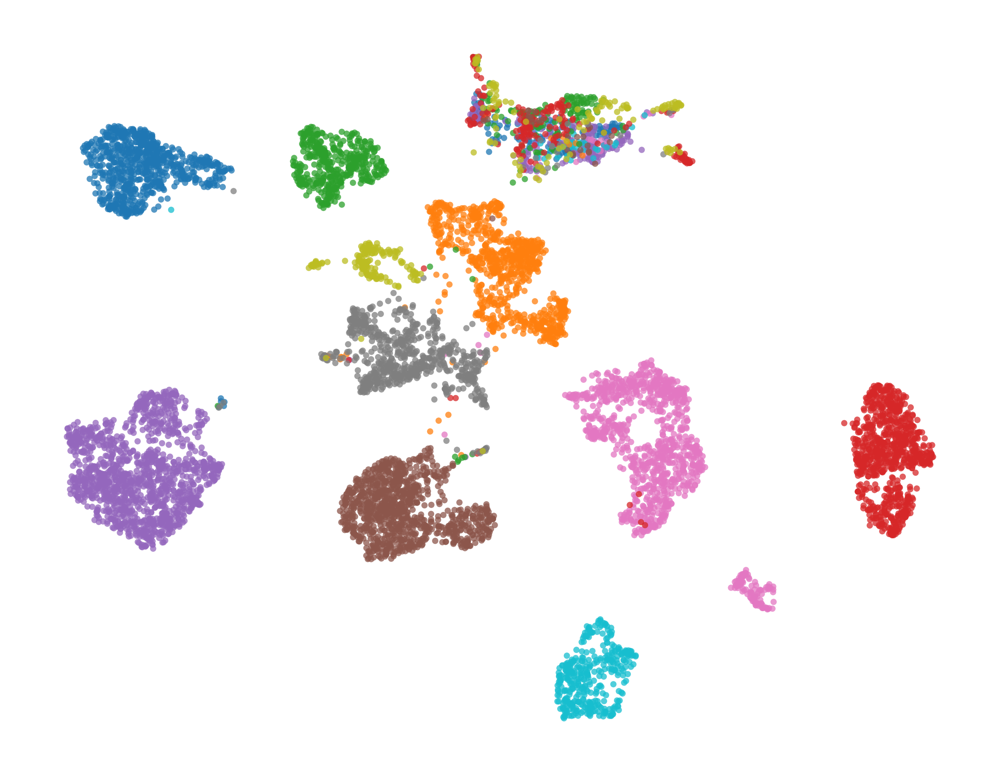

In [10]:
with plt.rc_context({"figure.dpi": (600), 'figure.figsize':(5.2, 4)}):
    sc.pl.umap(adata_epi, color=['PatientID',], 
            ncols=2,
            frameon=False, 
            alpha=0.75,
            legend_loc=None, 
            # s=10,
            title='',
            )
plt.show()

### Distinguishing normal vs. tumor cells

In [ ]:
''' 
Normal cells from different patients cluster together whereas tumor cells form patient-specific clusters.
We will leverage this property to distinguish the two types of cells. 
'''

/tmp/ipykernel_116274/3352959853.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_epi, resolution=0.15)


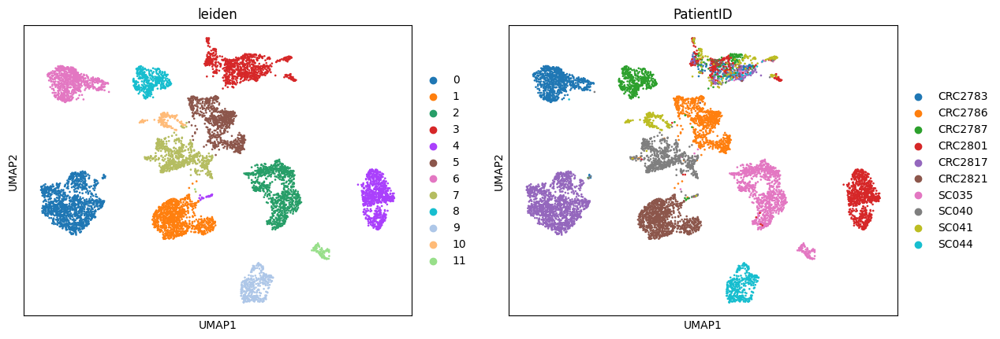

In [11]:
sc.tl.leiden(adata_epi, resolution=0.15)
sc.pl.umap(adata_epi, color=['leiden', 'PatientID'])

In [12]:
dict_BiopsySite_to_BiopsySite2 = {
    'Adjacent normal tissue' : 'Normal',
    'Core' : 'Tumor',
    'Invasive' : 'Tumor',
    'LymphNode' : 'Tumor',
    'Normal' : 'Normal',
    'Tumor' : 'Tumor'
}

adata_epi.obs['BiopsySite_2'] = [ dict_BiopsySite_to_BiopsySite2[BS] for BS in adata_epi.obs['BiopsySite'] ]

In [13]:
# Inspect patient-heterogeneity of each patient
PatientCompositionByLeidenCluster = list()

for leiden, edf in adata_epi.obs.groupby('leiden', observed=True):
    dict_PatientID_to_proportion = dict()
    for PatientID, edf2 in edf.groupby('PatientID', observed=True):
        dict_PatientID_to_proportion[PatientID] = len(edf2)/len(edf)
    dict_PatientID_to_proportion = dict(sorted(dict_PatientID_to_proportion.items(), key=lambda x:x[1], reverse=True))
    
    for PatientID, proportion in dict_PatientID_to_proportion.items():
        MajorPatientID = PatientID
        MajorProportion1 = proportion
        break 
    
    dict_BiopsySite_to_proportion = dict()
    for BiopsySite, edf2 in edf.groupby('BiopsySite_2', observed=True):
        dict_BiopsySite_to_proportion[BiopsySite] = len(edf2)/len(edf)
    
    if 'Normal' not in dict_BiopsySite_to_proportion.keys():
        dict_BiopsySite_to_proportion['Normal'] = 0
    
    # Leiden cluster    Proportion of the most abundanct patient within the cluster     Proportion of cells from normal samples
    print(f'{leiden}\t\t{round(100*MajorProportion1, 1)}\t\t\t{round(100*dict_BiopsySite_to_proportion['Normal'], 1)}')
    PatientCompositionByLeidenCluster.append( [leiden, round(100*MajorProportion1, 1), round(100*dict_BiopsySite_to_proportion['Normal'], 1), round(np.mean(edf[edf['NumSTRLoci']!=0]['MSI_score']), 1)] )

PatientCompositionByLeidenCluster = pd.DataFrame(PatientCompositionByLeidenCluster, columns=['leiden', 'MajorPatientPerc', 'NormalSamplePerc', 'MSI_score'])

0		99.3			0.4
1		99.7			0
2		99.6			0
3		20.1			70.4
4		97.2			1.2
5		99.1			1.4
6		99.7			0
7		96.5			51.2
8		100.0			0
9		100.0			0
10		100.0			0
11		100.0			0


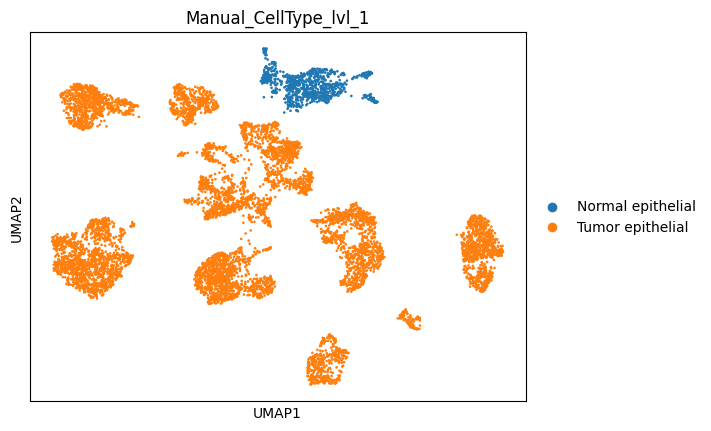

In [14]:
dict_leiden_to_EpiCellType = {
    '3' : 'Normal epithelial',
    '0' : 'Tumor epithelial',
    '1' : 'Tumor epithelial',
    '2' : 'Tumor epithelial',
    '4' : 'Tumor epithelial',
    '5' : 'Tumor epithelial',
    '6' : 'Tumor epithelial',
    '8' : 'Tumor epithelial',
    '9' : 'Tumor epithelial',
    '10' : 'Tumor epithelial',
    '11' : 'Tumor epithelial',
    '7' : 'Tumor epithelial',
}

adata_epi.obs['Manual_CellType_lvl_1'] = [ dict_leiden_to_EpiCellType[leiden] for leiden in adata_epi.obs['leiden'] ]
sc.pl.umap(adata_epi, color=['Manual_CellType_lvl_1'])

### Save annotation results to main Adata

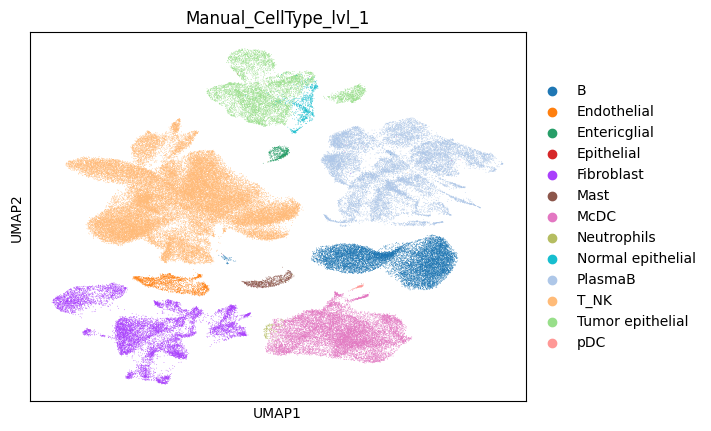

In [15]:
dict_Identifier_to_CellType = { tup.Identifier : tup.Manual_CellType_lvl_1 for tup in adata_epi.obs.itertuples() }

temp = list()
for tup in adata.obs.itertuples():
    try:
        temp.append( dict_Identifier_to_CellType[tup.Identifier] )
    except KeyError:
        temp.append( tup.Author_CellType_lvl_1 )
    
adata.obs['Manual_CellType_lvl_1'] = temp
sc.pl.umap(adata, color=['Manual_CellType_lvl_1'])

### Save results

In [10]:
adata.write(f'{DIR_OUT}/adata_j.preprocessed.NanoMnT.TumorLabeled.h5ad')
adata_epi.write(f'{DIR_OUT}/adata_j.preprocessed.NanoMnT.TumorLabeled.epithelial.h5ad')

## Visualize MSI score of Epithelial cells with UMAP (Fig. 2a)

In [16]:
adata_epi_MSI = adata_epi[(adata_epi.obs['NumSTRLoci']>=10)].copy()

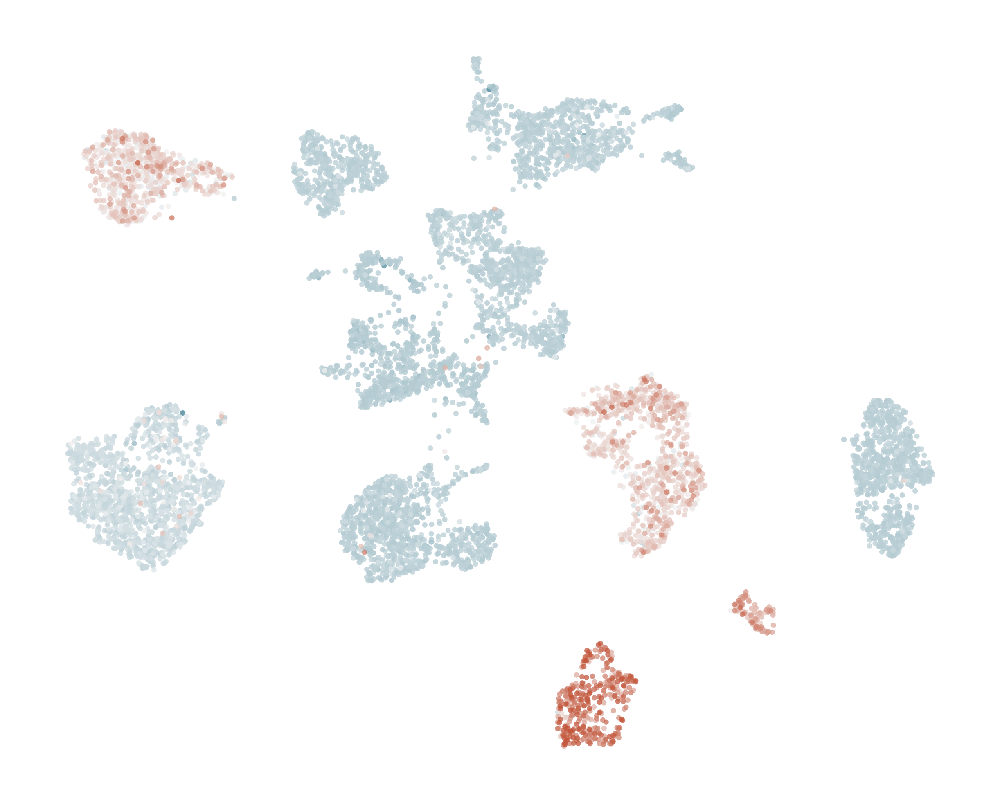

In [17]:
with plt.rc_context({"figure.dpi": (600), 'figure.figsize':(5, 4)}):
    sc.pl.umap(adata_epi_MSI, color=['MSI_score',], 
            ncols=2,
            cmap=sns.diverging_palette(220, 20, as_cmap=True),
            vmin=-5, vmax=10,
            colorbar_loc=None,
            frameon=False, 
            legend_loc=None,
            alpha=0.75, 
            s=10,
            title='',
            )
plt.show()

## NanoMnT-scMSI results

In [ ]:
''' 
We will apply NanoMnT-scMSI to see if MSI patients' cancer cells indeed show MS profile that resembles MSI phenotype
'''

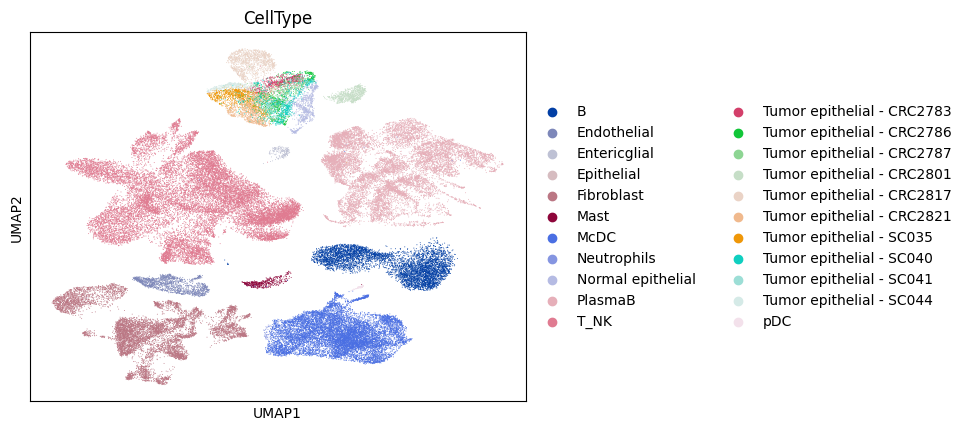

In [30]:
DIR_NANOMNT_OUT = f'{DIR_OUT}/scMSI_Joanito_et_al'
if os.path.exists(DIR_NANOMNT_OUT)==False:
    os.mkdir(DIR_NANOMNT_OUT)

# Annotate tumor cells 
dict_Identifier_to_CellType = dict()
for tup in adata_epi_MSI.obs.itertuples():
    if tup.Manual_CellType_lvl_1 == 'Tumor epithelial':
        dict_Identifier_to_CellType[tup.Identifier] = f'Tumor epithelial - {tup.PatientID}'
    else:
        dict_Identifier_to_CellType[tup.Identifier] = f'Normal epithelial'

temp = list()
for tup in adata_MSI.obs.itertuples():
    try:
        temp.append( dict_Identifier_to_CellType[tup.Identifier] )
    except KeyError:
        temp.append( tup.Author_CellType_lvl_1 )
    
adata_MSI.obs['CellType'] = temp

sc.pl.umap(adata_MSI, color=['CellType'])
adata_MSI.write(f'{DIR_NANOMNT_OUT}/adata_j.preprocessed.NanoMnT.scMSI_input.h5ad')

In [35]:
cmd = f'python {PATH_SCMSI_FIND} -a {DIR_NANOMNT_OUT}/adata_j.preprocessed.NanoMnT.scMSI_input.h5ad -n B,Endothelial,Entericglial,Fibroblast,Mast,McDC,Neutrophils,PlasmaB,T_NK -out {DIR_NANOMNT_OUT}'
!{cmd}

In [38]:
scMSI_results = pd.read_csv(f'{DIR_NANOMNT_OUT}/adata_j.preprocessed.NanoMnT.scMSI_input.findMSI_results.tsv', sep='\t')
scMSI_results[(scMSI_results['pval']<=0.01) & (scMSI_results['delta']>=0.4)]

,CT,pval,delta,n_cells,logPval
2,Tumor epithelial - CRC2783,0.000000e+00,0.989738,769,23.025851
6,Tumor epithelial - CRC2817,9.130141e-289,0.800902,1297,23.025851
8,Tumor epithelial - SC035,0.000000e+00,0.993304,1017,23.025851
11,Tumor epithelial - SC044,8.116589e-217,0.998524,371,23.025851


In [39]:
scMSI_results[~((scMSI_results['pval']<=0.01) & (scMSI_results['delta']>=0.4))]

,CT,pval,delta,n_cells,logPval
0,Epithelial,1.000000e+00,0.670007,1,-1.000000e-10
1,Normal epithelial,1.056759e-04,0.107154,842,9.155133e+00
3,Tumor epithelial - CRC2786,2.668033e-10,0.138349,793,2.172620e+01
4,Tumor epithelial - CRC2787,8.811716e-03,0.111907,443,4.731673e+00
5,Tumor epithelial - CRC2801,8.987392e-07,0.082989,800,1.392216e+01
7,Tumor epithelial - CRC2821,4.966662e-01,0.026939,941,6.998370e-01
9,Tumor epithelial - SC040,1.003098e-17,-0.232843,665,2.302585e+01
10,Tumor epithelial - SC041,1.722768e-05,-0.264596,160,1.096899e+01
12,pDC,7.560914e-01,-0.101637,89,2.795930e-01


## Visualization of MSI scores of patients across different MS lengths (Fig. 2b)


In [22]:
AlleleTable = pd.read_csv(PATH_TO_JOANITO_ALLELETABLE, sep='\t')

In [27]:
SG1_metadata = pd.read_csv(PATH_TO_JOANITO_SG1_METADATA, sep='\t')
KUL_metadata = pd.read_csv(PATH_TO_JOANITO_KUL_METADATA, sep='\t')

In [28]:
# Label isTumor (distinguish tumor cells vs. normal cells in AlleleTable)
dict_Identifier_to_isTumor = { tup.Identifier : bool(tup.Manual_CellType_lvl_1=='Tumor epithelial') for tup in adata.obs.itertuples() }
for identifier in AlleleTable['Identifier']:
    try:
        dict_Identifier_to_isTumor[identifier]
    except KeyError:
        dict_Identifier_to_isTumor[identifier] = 'N/A'
AlleleTable['isTumor'] = [ dict_Identifier_to_isTumor[identifier] for identifier in AlleleTable['Identifier'] ]

# Label PatientID
dict_SampleID_to_PatientID = dict()
for tup in SG1_metadata.itertuples():
    dict_SampleID_to_PatientID[list(tup)[3]] = list(tup)[2]
for tup in KUL_metadata.itertuples():
    dict_SampleID_to_PatientID[list(tup)[3]] = list(tup)[2]
AlleleTable['PatientID'] = [ dict_SampleID_to_PatientID[SID] for SID in AlleleTable['SampleID'] ]

In [29]:
MSProfileByLength = list()
for PatientID, edf in AlleleTable.groupby("PatientID"):
    for isTumor, edf2 in edf.groupby("isTumor"):
        for reference_STR_allele, edf3 in edf2.groupby("reference_STR_allele"):
            MSProfileByLength.append( [PatientID, reference_STR_allele, isTumor, np.mean(edf3['diff'].dropna()), np.std(edf3['diff'].dropna()), len(edf3.dropna()), ] )
MSProfileByLength = pd.DataFrame(MSProfileByLength, columns=['PatientID', 'reference_STR_allele', 'isTumor', 'AvgSTRDiff', 'StdSTRDiff', 'NumSTRLoci'])
MSProfileByLength['MSI_score'] = -1 * MSProfileByLength['AvgSTRDiff'] * MSProfileByLength['StdSTRDiff']

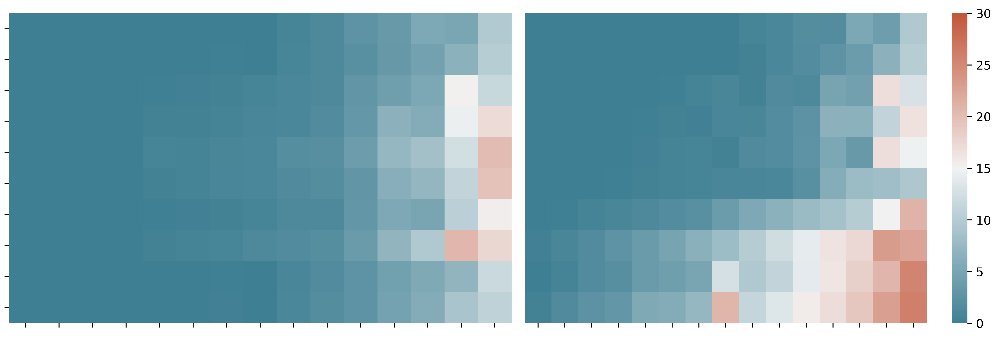

In [35]:
# Calculate tumor-normal by microsatellite length
fig, axes = plt.subplots(1, 2, figsize=(12, 4), dpi=500, sharex=True, sharey=True)
palette_e = sns.diverging_palette(220, 20, as_cmap=True)
list_heatmap_patient_order = ['SC041', 'SC040', 'CRC2821', 'CRC2801', 'CRC2787', 'CRC2786', 'CRC2817', 'CRC2783', 'SC035', 'SC044']

vmin_e, vmax_e = -3, 3
vmin_e, vmax_e = 0, 30

ax = sns.heatmap(MSProfileByLength[(MSProfileByLength['isTumor']==False)].pivot( index='PatientID', columns='reference_STR_allele', values='MSI_score' ).reindex(list_heatmap_patient_order), 
            cmap=palette_e, ax=axes[0],
            vmin=vmin_e, vmax=vmax_e, 
            cbar=False
            )
ax.set_xlabel('');
ax.set_xticklabels([]);
ax.set_yticklabels([]);
ax.set_ylabel('');
ax.tick_params(bottom=True)

ax = sns.heatmap(MSProfileByLength[(MSProfileByLength['isTumor']==True) ].pivot( index='PatientID', columns='reference_STR_allele', values='MSI_score' ).reindex(list_heatmap_patient_order), 
            cmap=palette_e, ax=axes[1],
            vmin=vmin_e, vmax=vmax_e, 
            cbar=True,
            )
ax.set_xlabel('');
ax.set_ylabel('');
ax.set_xticklabels([]);
ax.set_yticklabels([]);
ax.tick_params(left=False, bottom=True)

fig.tight_layout();
plt.show()

## Visualization of average MSI scores of patients (Fig. 2c)

<Figure size 1500x2250 with 0 Axes>

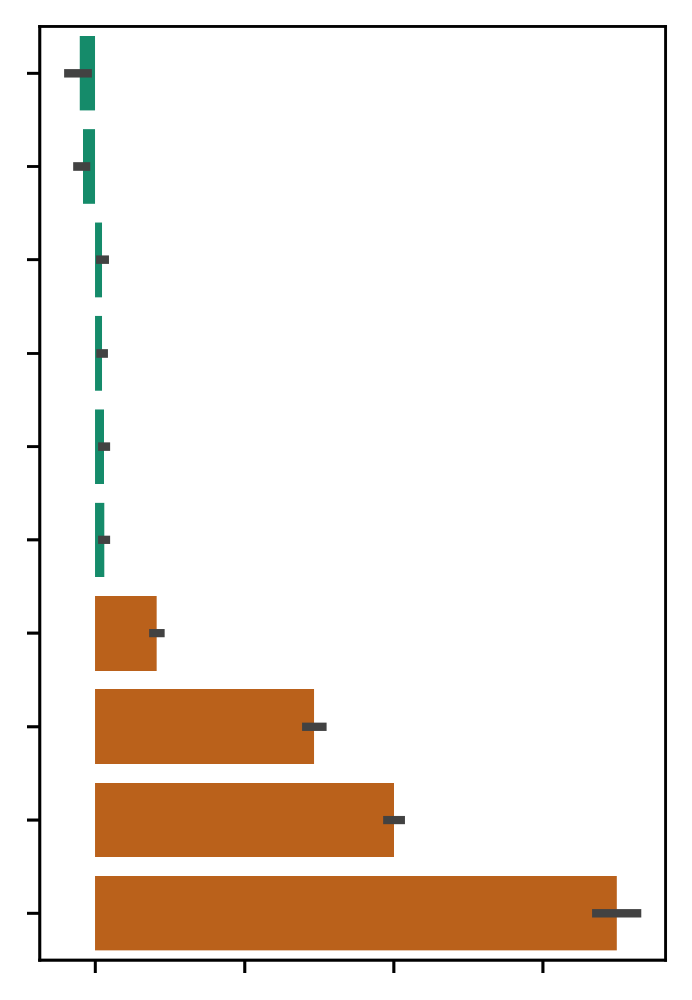

In [38]:
plt.figure(figsize=(3, 4.5), dpi=500)
ax = sns.barplot(data=adata_epi.obs, y='PatientID', x='MSI_score', hue='MSI_status', 
            order=['SC041', 'SC040', 'CRC2821', 'CRC2801', 'CRC2786', 'CRC2787', 'CRC2817', 'CRC2783', 'SC035', 'SC044'],
            palette={
                'MSI-H' : sns.color_palette('colorblind6')[2],
                'MSS' : sns.color_palette('colorblind6')[1],
            },
            legend=None,
            )
ax.set_xlabel('');
ax.set_ylabel('');
ax.set_xticklabels([]);
ax.set_yticklabels([]);
plt.show()

## Patient SC035 analysis 

### Re-clustering SC035 tumor cells (Fig. 2d)

In [ ]:
adata_epi_tumor_SC035 = adata_epi[(adata_epi.obs['PatientID']=='SC035') & (adata_epi.obs['Manual_CellType_lvl_1']=='Tumor epithelial')].copy()
adata_epi_tumor_SC035 = adata_epi_tumor_SC035.raw.to_adata()

sc.pp.normalize_total(adata_epi_tumor_SC035)
sc.pp.log1p(adata_epi_tumor_SC035)
sc.pp.highly_variable_genes(adata_epi_tumor_SC035, n_top_genes=2000, batch_key="SampleID")

adata_epi_tumor_SC035.raw = adata_epi_tumor_SC035.copy()
adata_epi_tumor_SC035 = adata_epi_tumor_SC035[:, adata_epi_tumor_SC035.var.highly_variable]

sc.pp.scale(adata_epi_tumor_SC035, max_value=10)
sc.tl.pca(adata_epi_tumor_SC035, svd_solver="arpack")

sc.pp.neighbors(adata_epi_tumor_SC035, n_neighbors=15, n_pcs=40)
sc.tl.umap(adata_epi_tumor_SC035, random_state=0)
sc.tl.leiden(adata_epi_tumor_SC035, key_added='SC035_subLeiden', resolution=0.1)

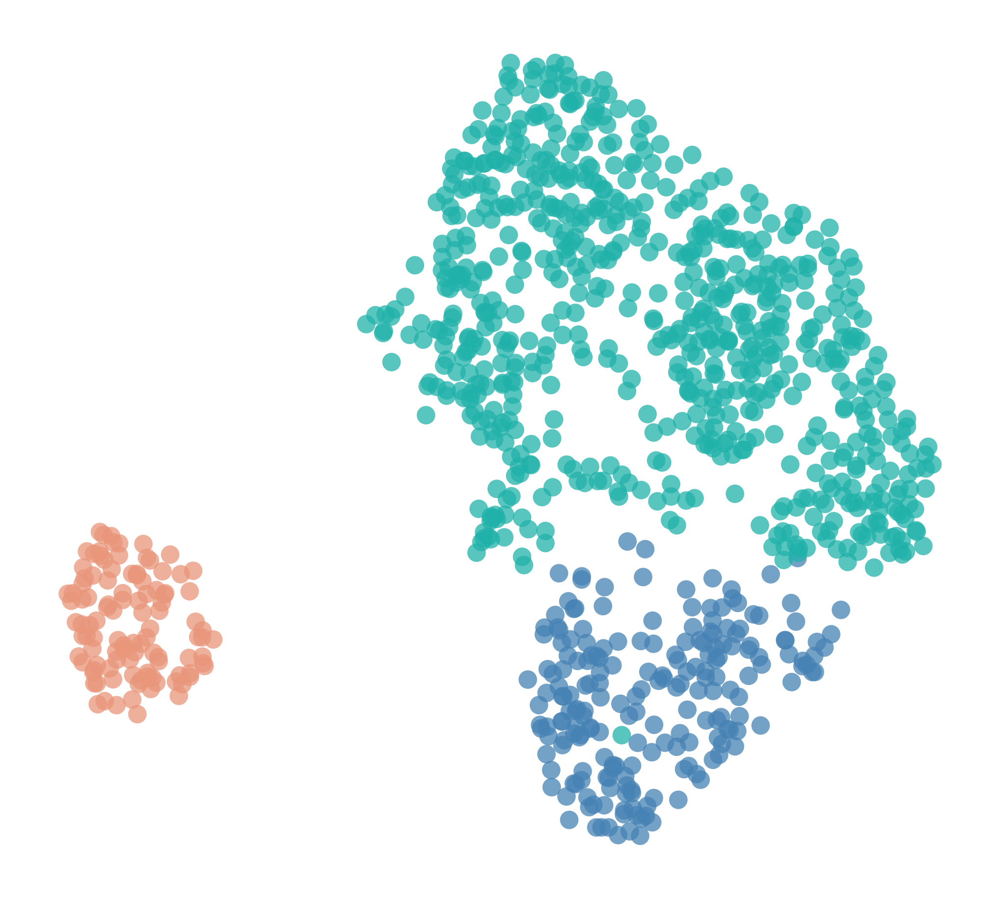

In [45]:
with plt.rc_context({"figure.dpi": (500), 'figure.figsize':(5, 4.5)},):
       sc.pl.umap(adata_epi_tumor_SC035, 
              color=['SC035_subLeiden',], 
              palette={'0' : 'lightseagreen', '1' : 'steelblue', '2' : 'darksalmon',},
              legend_loc=None,
              alpha=0.75,
              title='',
              frameon=False,
              )

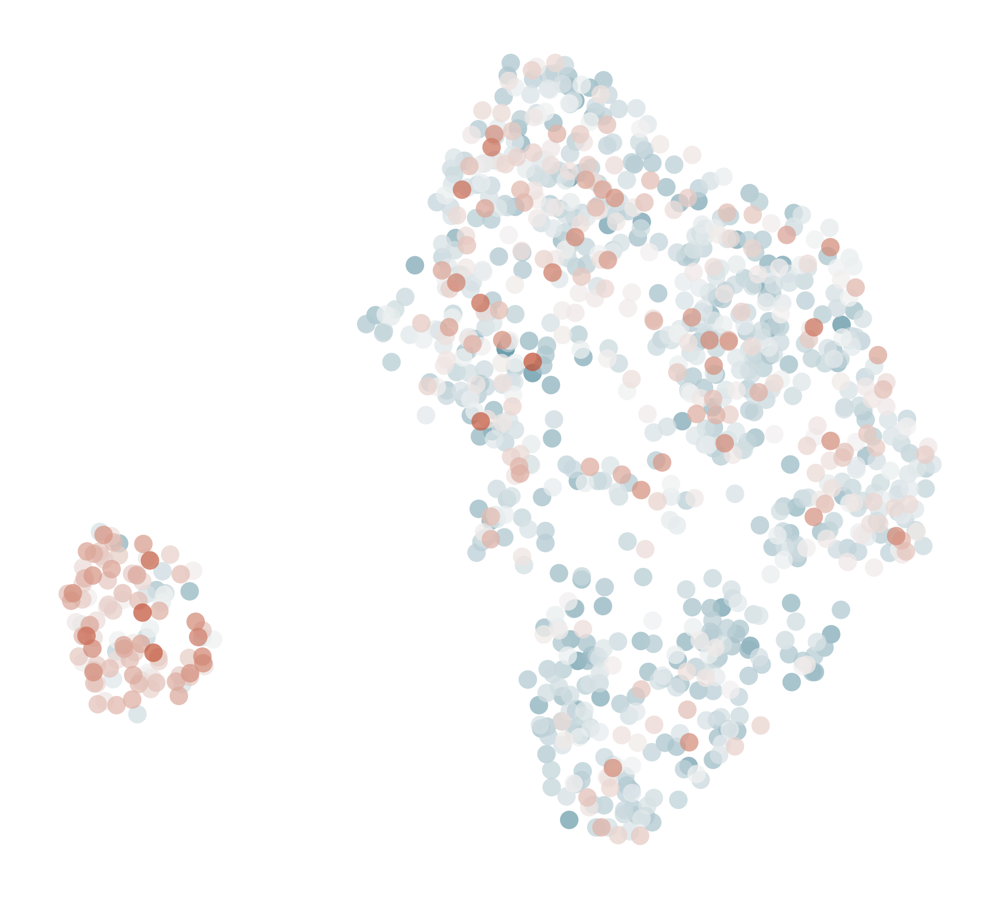

In [46]:
with plt.rc_context({"figure.dpi": (500), 'figure.figsize':(5, 4.5)},):
       sc.pl.umap(adata_epi_tumor_SC035, 
              color=['MSI_score',], 
              cmap=sns.diverging_palette(220, 20, as_cmap=True),
              legend_loc=None,
              colorbar_loc=None,
              alpha=0.75,
              title='',
              frameon=False,
              )

### Re-clustering all SC035 cells (Extended Data Fig. 2b)

In [49]:
adata_SC035 = adata[adata.obs['PatientID']=='SC035'].copy()
adata_SC035 = adata_SC035.raw.to_adata()
adata_SC035.raw = adata_SC035.copy()

sc.pp.normalize_total(adata_SC035)
sc.pp.log1p(adata_SC035)
sc.pp.highly_variable_genes(adata_SC035, n_top_genes=2000, batch_key="SampleID")

adata_SC035 = adata_SC035[:, adata_SC035.var.highly_variable]

sc.pp.scale(adata_SC035, max_value=10)
sc.tl.pca(adata_SC035, svd_solver="arpack")

sc.pp.neighbors(adata_SC035, n_neighbors=25, n_pcs=40)
sc.tl.umap(adata_SC035, random_state=0)

AnnData object with n_obs × n_vars = 9748 × 2000
    obs: 'doublet_score', 'predicted_doublet', 'SampleID', 'PatientID', 'BiopsySite', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'Identifier', 'Author_CellType_lvl_1', 'Author_CellType_lvl_2', 'n_genes', 'AvgSTRDiff', 'StdSTRDiff', 'NumSTRLoci', 'MSI_score', 'MSI_status', 'Manual_CellType_lvl_1'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'hvg', 'log1p', 'neighbors', 'pca', 'umap', 'Manual_CellType_lvl_1_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

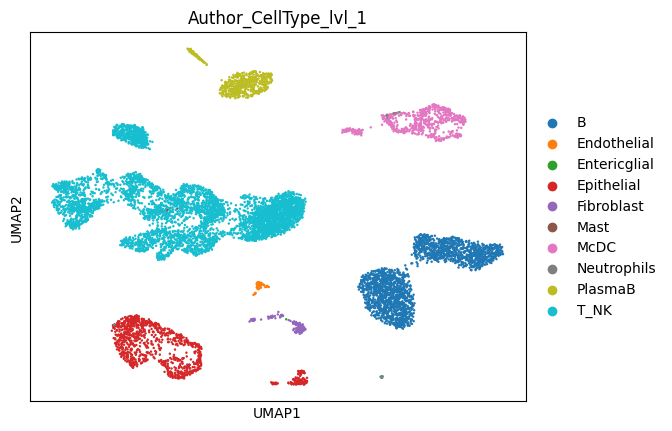

In [52]:
sc.pl.umap(adata_SC035, color=['Author_CellType_lvl_1'], )

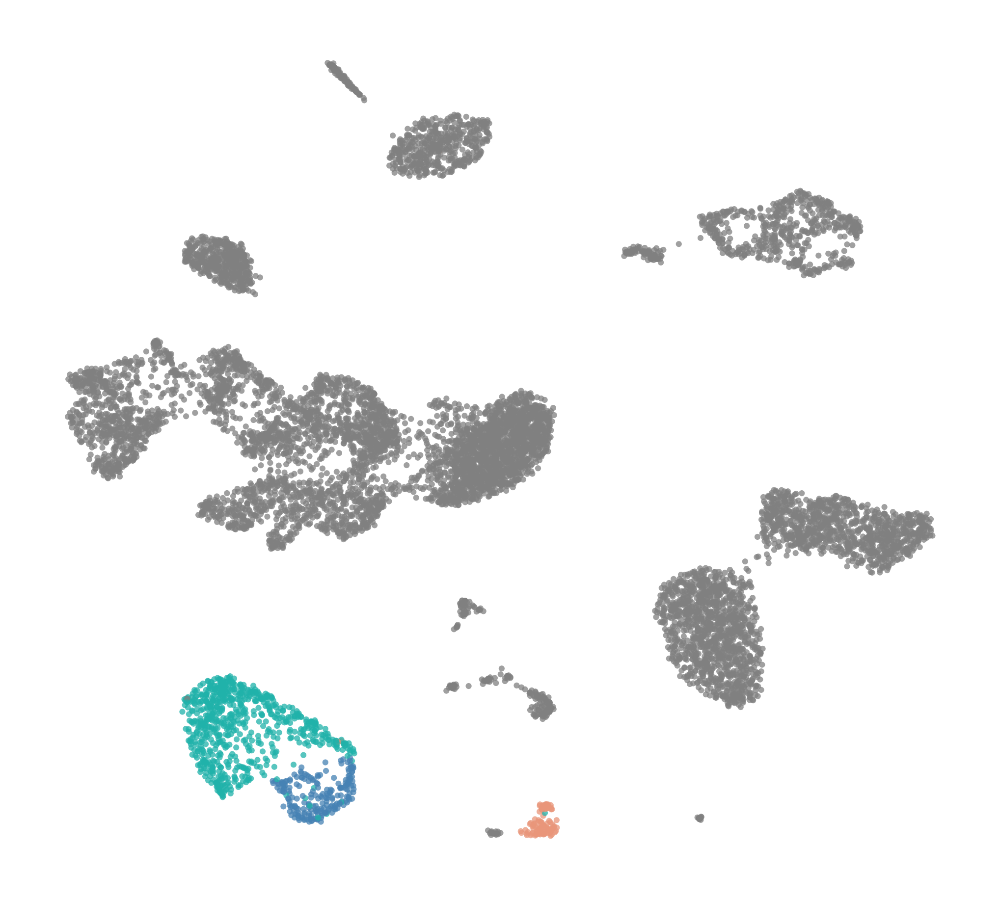

In [69]:
dict_Identifier_to_SC035_TumorLeiden = { tup.Identifier : f'Tumor {tup.SC035_subLeiden}' for tup in adata_epi_tumor_SC035.obs.itertuples() }
temp = list()
for tup in adata_SC035.obs.itertuples():
    try:
        temp.append( dict_Identifier_to_SC035_TumorLeiden[tup.Identifier] )
    except KeyError:
        temp.append( 'Normal' )
adata_SC035.obs['TumorCellType'] = temp 

with plt.rc_context({"figure.dpi": (500), 'figure.figsize':(5, 4.5)},):
    sc.pl.umap(adata_SC035, 
            color=['TumorCellType',], 
            cmap=sns.diverging_palette(220, 20, as_cmap=True),
            palette={'Normal' : 'gray', 'Tumor 0' : 'lightseagreen', 'Tumor 1' : 'steelblue', 'Tumor 2' : 'darksalmon',},
            legend_loc=None,
            # colorbar_loc=None,
            alpha=0.75,
            title='',
            frameon=False,
            )

### Comparison of MSI score among SC035 tumor Leiden clusters (Extended Data Fig. 2e)

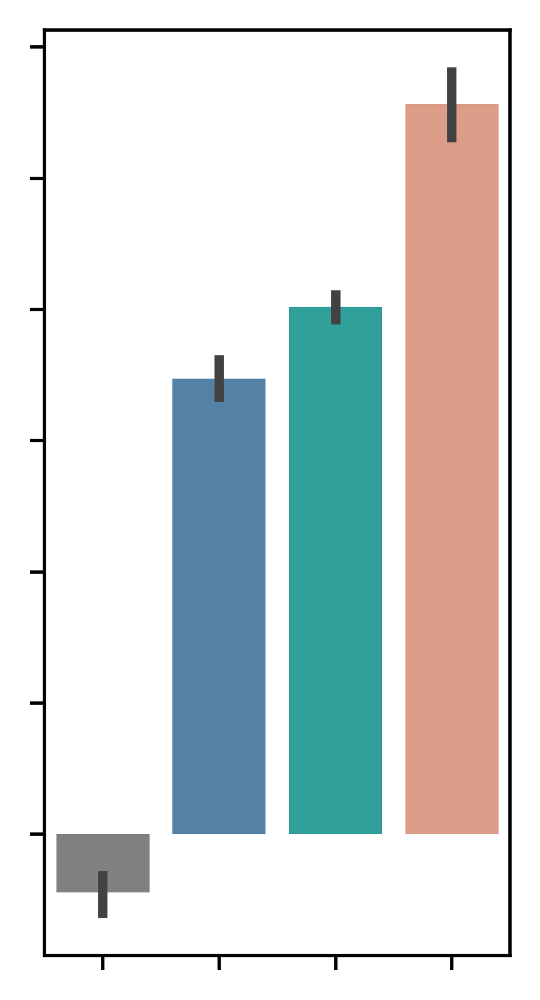

In [63]:
plt.figure(figsize=(2, 4), dpi=500)
ax = sns.barplot(data=adata_SC035.obs, x='TumorCellType', y='MSI_score', 
                 hue='TumorCellType',
                 palette={'Normal' : 'gray', 
                          'Tumor 0' : 'lightseagreen', 
                          'Tumor 1' : 'steelblue', 
                          'Tumor 2' : 'darksalmon',
                        },
                 order=['Normal', 'Tumor 1', 'Tumor 0', 'Tumor 2']
                 )
ax.set_xticklabels([]);
ax.set_yticklabels([]);
ax.set_xlabel('');
ax.set_ylabel('');
plt.show()

### Run SComatic

In [ ]:
# DIR_BAM: Directory that contains Cell Ranger outputs of all SC035 samples.
DIR_BAM = '/node200data/18parkky/datasets/data/public/processed_data/Joanito_et_al/KUL/MSI_H/cellranger'

PATH_EXT048_BAM = f'{DIR_BAM}/EXT048/outs/possorted_genome_bam.bam'
PATH_EXT049_BAM = f'{DIR_BAM}/EXT049/outs/possorted_genome_bam.bam'
PATH_EXT050_BAM = f'{DIR_BAM}/EXT050/outs/possorted_genome_bam.bam'
PATH_EXT051_BAM = f'{DIR_BAM}/EXT051/outs/possorted_genome_bam.bam'

PAHT_REFERENCE_GENOME = '/node200data/18parkky/datasets/reference/genome/hg38.fa'

DIR_SCOMATIC_OUT = f'{DIR_OUT}/SC035_SCOMATIC_OUT'
DIR_SCOMATIC_SCRIPTS = '/home/18parkky/git/SComatic/scripts'

PATH_EDITING    = '/home/18parkky/git/SComatic/RNAediting/AllEditingSites.hg38.txt.gz'
PATH_PON        = '/home/18parkky/git/SComatic/PoNs/PoN.scRNAseq.hg38.tsv.gz'

In [ ]:
for SampleID in set(adata_SC035.obs['SampleID']):
    if os.path.exists(f'{DIR_SCOMATIC_OUT}/{SampleID}')==False:
        os.mkdir(f'{DIR_SCOMATIC_OUT}/{SampleID}')

#### SplitBamCellTypes.py

In [ ]:
PATH_SplitBamCellTypes_script = f'{DIR_SCOMATIC_SCRIPTS}/SplitBam/SplitBamCellTypes.py'

# Create metadata
with open(f'{DIR_SCOMATIC_OUT}/SplitBamCellTypes.sh', 'w') as f:
    for SampleID, edf in adata_SC035.obs.groupby('SampleID', observed=True,):
        DIR_save_sample = f'{DIR_SCOMATIC_OUT}/{SampleID}'
        DIR_out_sample = f'{DIR_SCOMATIC_OUT}/{SampleID}/SplitBamOut'
        
        if os.path.exists(DIR_out_sample)==False:
            os.mkdir(DIR_out_sample)
            
        PATH_metadata = f'{DIR_save_sample}/metadata.{SampleID}.tsv'
        metadata = pd.DataFrame([ ['-'.join(tup.Index.split('-')[:2]), tup.SComatic_CellType] for tup in edf.itertuples() ], columns=['Index', 'Cell_type'])
        metadata.to_csv(PATH_metadata, sep='\t', index=False)
        
        cmd = f'python {PATH_SplitBamCellTypes_script} --bam {DIR_BAM}/{SampleID}/outs/possorted_genome_bam.bam --meta {PATH_metadata} --outdir {DIR_out_sample}'
        f.write(f'{cmd}\n')

In [ ]:
!bash {DIR_SCOMATIC_OUT}/SplitBamCellTypes.sh

#### BaseCellCounter.py

In [ ]:
PATH_BaseCellCounter_script = f'{DIR_SCOMATIC_SCRIPTS}/BaseCellCounter/BaseCellCounter.py'

with open(f'{DIR_SCOMATIC_OUT}/BaseCellCounter.sh', 'w') as f:
    for SampleID, edf in adata_SC035.obs.groupby('SampleID', observed=True,):
        DIR_SplittedBam = f'{DIR_SCOMATIC_OUT}/{SampleID}/SplitBamOut'
        DIR_out_sample  = f'{DIR_SCOMATIC_OUT}/{SampleID}/BaseCellCounterOut'
        if os.path.exists(DIR_out_sample)==False:
            os.mkdir(DIR_out_sample)
        
        for idx, PATH_SplittedBam in enumerate(glob.glob(f'{DIR_SplittedBam}/*.bam')):
            DIR_temp_out = f'{DIR_SCOMATIC_OUT}/{SampleID}/temp_{idx}'
            cmd = f'python {PATH_BaseCellCounter_script} --bam {PATH_SplittedBam} --ref {PAHT_REFERENCE_GENOME} --chrom all --out_folder {DIR_out_sample} --nprocs 16 --tmp_dir {DIR_temp_out}'
            f.write(f'{cmd}\n')

In [ ]:
!bash {DIR_SCOMATIC_OUT}/BaseCellCounter.sh

#### MergeBaseCellCounts.py

In [ ]:
PATH_MergeBaseCellCounts_script = f'{DIR_SCOMATIC_SCRIPTS}/MergeCounts/MergeBaseCellCounts.py'
with open(f'{DIR_SCOMATIC_OUT}/MergeBaseCellCounts.sh', 'w') as f:
    for SampleID, edf in adata_SC035.obs.groupby('SampleID', observed=True,):
        DIR_BaseCellCounts          = f'{DIR_SCOMATIC_OUT}/{SampleID}/BaseCellCounterOut'
        PATH_MergeBaseCellCounts    = f'{DIR_SCOMATIC_OUT}/{SampleID}/MergedBaseCellCounts.AllCellTypes.tsv'
        
        cmd = f'python {PATH_MergeBaseCellCounts_script} --tsv_folder {DIR_BaseCellCounts} --outfile {PATH_MergeBaseCellCounts}'
        f.write(f'{cmd}\n')

In [ ]:
!bash {DIR_SCOMATIC_OUT}/MergeBaseCellCounts.sh

#### BaseCellCalling.step1.py

In [ ]:
PATH_BaseCellCalling_step1_script = f'{DIR_SCOMATIC_SCRIPTS}/BaseCellCalling/BaseCellCalling.step1.py'

with open(f'{DIR_SCOMATIC_OUT}/BaseCellCalling_step1.sh', 'w') as f:
    for SampleID, edf in adata_SC035.obs.groupby('SampleID', observed=True,):

        PATH_MergeBaseCellCounts        = f'{DIR_SCOMATIC_OUT}/{SampleID}/MergedBaseCellCounts.AllCellTypes.tsv'
        PATH_BaseCellCalling_step1_out  = f'{DIR_SCOMATIC_OUT}/{SampleID}/{SampleID}'
        
        cmd = f'python {PATH_BaseCellCalling_step1_script} --infile {PATH_MergeBaseCellCounts} --ref {PAHT_REFERENCE_GENOME} --outfile {PATH_BaseCellCalling_step1_out}'
        f.write(f'{cmd}\n')


In [ ]:
!bash {DIR_SCOMATIC_OUT}/BaseCellCalling_step1.sh

#### BaseCellCalling.step2.py

In [ ]:
PATH_BaseCellCalling_step2_script = f'{DIR_SCOMATIC_SCRIPTS}/BaseCellCalling/BaseCellCalling.step2.py'

with open(f'{DIR_SCOMATIC_OUT}/BaseCellCalling_step2.sh', 'w') as f:
    for SampleID, edf in adata_SC035.obs.groupby('SampleID', observed=True,):
        PATH_BaseCellCalling_step1_out = f'{DIR_SCOMATIC_OUT}/{SampleID}/{SampleID}.calling.step1.tsv'
        if os.path.exists(PATH_BaseCellCalling_step1_out)==False:
            pass 
        PATH_BaseCellCalling_step2_out = f'{DIR_SCOMATIC_OUT}/{SampleID}/{SampleID}'
        
        cmd = f'python {PATH_BaseCellCalling_step2_script} --infile {PATH_BaseCellCalling_step1_out} --outfile {PATH_BaseCellCalling_step2_out} --editing {PATH_EDITING} --pon {PATH_PON}'
        f.write(f'{cmd}\n') 

In [ ]:
!bash {DIR_SCOMATIC_OUT}/BaseCellCalling_step2.sh

#### Filter PASS variants

In [ ]:
SNV_variants = list()
for SampleID in ['EXT048', 'EXT049', 'EXT050', 'EXT051']:

    PATH_BaseCellCalling_step2_out = f'{DIR_SCOMATIC_OUT}/{SampleID}/{SampleID}.calling.step2.tsv'
    df = pd.read_csv(PATH_BaseCellCalling_step2_out, sep='\t', skiprows=28)
    origLength = len(df)
    df['PASS'] = [  bool(set(CellTypeFilter.split(','))==set(['PASS'])) for CellTypeFilter in df['Cell_type_Filter'] ]
    SNV_variants.append(df)

SNV_variants = pd.concat(SNV_variants)

#### SingleCellGenotype.py

In [ ]:
PATH_SingleCellGenotype_script = f'{DIR_SCOMATIC_SCRIPTS}/SingleCellGenotype/SingleCellGenotype.py'
threads = 32

with open(f'{DIR_SCOMATIC_OUT}/SingleCellGenotype.sh', 'w') as f:
    for SampleID, edf in adata_SC035.obs.groupby('SampleID', observed=True,):
        PATH_BaseCellCalling_step2_filtered = f'{DIR_SCOMATIC_OUT}/{SampleID}/{SampleID}.calling.step2.SNP_pass.tsv'
        PATH_metadata = f'{DIR_SCOMATIC_OUT}/{SampleID}/metadata.{SampleID}.tsv'
        
        DIR_SplittedBam = f'{DIR_SCOMATIC_OUT}/{SampleID}/SplitBamOut'
        for idx, PATH_SplittedBam in enumerate(glob.glob(f'{DIR_SplittedBam}/*.bam')):
            CellType = PATH_SplittedBam.split('/')[-1].split('.')[1]
            PATH_SingleCellGenotype_out = f'{DIR_SCOMATIC_OUT}/{SampleID}/{SampleID}.{CellType}.single_cell_genotype.tsv'
            cmd = f'python {PATH_SingleCellGenotype_script} --bam {PATH_SplittedBam} --infile {PATH_BaseCellCalling_step2_filtered} --ref {PAHT_REFERENCE_GENOME} --meta {PATH_metadata} --nprocs {threads} --outfile {PATH_SingleCellGenotype_out}'
            f.write(f'{cmd}\n')

In [ ]:
!bash {DIR_SCOMATIC_OUT}/SingleCellGenotype.sh

### Analyze SComatic results

#### Merge SingleCellGenotype results into one

In [ ]:
SingleCellGenotype_Results = list()

for SampleID, edf in adata_SC035.obs.groupby('SampleID', observed=True,):
    for PATH_SingleCellGenotype_out in glob.glob(f'{DIR_SCOMATIC_OUT}/{SampleID}/*single_cell_genotype.tsv'):
        df = pd.read_csv(PATH_SingleCellGenotype_out, sep='\t')
        df['SampleID'] = SampleID 
        df['locus'] = [ f'{list(tup)[1]}_{list(tup)[2]}' for tup in df.itertuples() ]
        SingleCellGenotype_Results.append(df)
    
SingleCellGenotype_Results = pd.concat(SingleCellGenotype_Results)
SingleCellGenotype_Results.reset_index(inplace=True, drop=True)

# Save results
SingleCellGenotype_Results.to_csv(f'{DIR_OUT}/SingleCellGenotype.merged.tsv', sep='\t', index=False)

In [66]:
SingleCellGenotype_Results = pd.read_csv(f'{DIR_OUT}/SingleCellGenotype.merged.tsv', sep='\t',)

/tmp/ipykernel_116274/4220375527.py:1: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  SingleCellGenotype_Results = pd.read_csv(f'{DIR_OUT}/SingleCellGenotype.merged.tsv', sep='\t',)


#### QC

In [67]:
# Filter by read counts
SingleCellGenotype_Results_filtered = SingleCellGenotype_Results[(SingleCellGenotype_Results['Num_reads']>=3)].copy()
SingleCellGenotype_Results_filtered['Identifier'] = [ f'{tup.SampleID}-{tup.CB}' for tup in SingleCellGenotype_Results_filtered.itertuples() ]

# Filter by cell counts
dict_locus_to_coverage = { locus : len(edf) for locus, edf in SingleCellGenotype_Results_filtered.groupby('locus') }
dict_locus_to_coverage = { k : v for k,v in dict_locus_to_coverage.items() if v>100 }
dict_locus_to_coverage = dict(sorted(dict_locus_to_coverage.items(), key=lambda x:x[1], reverse=True))
SingleCellGenotype_Results_filtered = SingleCellGenotype_Results_filtered[SingleCellGenotype_Results_filtered['locus'].isin(dict_locus_to_coverage.keys())].copy()

In [68]:
# Condition 1: Cell_type_expected == Cell_type_observed
SingleCellGenotype_Results_filtered['condition1'] = [ bool(tup.Cell_type_observed in tup.Cell_type_expected.split(',')) for tup in SingleCellGenotype_Results_filtered.itertuples() ]
# Condition 2: ALT_expected == Base_observed
SingleCellGenotype_Results_filtered['condition2'] = [ bool(tup.Base_observed in tup.ALT_expected.split(',')) for tup in SingleCellGenotype_Results_filtered.itertuples() ]

#### Identify zygosity of each locus using genotypes from norma cells

In [70]:
SingleCellGenotype_Results_filtered_N = SingleCellGenotype_Results_filtered[(SingleCellGenotype_Results_filtered['Cell_type_observed']=='Normal')].copy()

minimumCellCount = 10
HostGenotype    = list()
UnresolvedLoci  = list()

for locus, edf in SingleCellGenotype_Results_filtered_N.groupby('locus', observed=True):
    if len(edf) < minimumCellCount: continue 
    
    dict_ObservedAllele_to_Frequency = { Base_observed : len(edf2)/len(edf) for Base_observed, edf2 in edf.groupby('Base_observed', observed=True) }
    
    temp = [locus, edf.iloc[0].REF, len(edf),]
    
    if len(dict_ObservedAllele_to_Frequency) == 2:
        AlleleType = 'biallelic'
        for ObservedAllele, AlleleFrequency in dict_ObservedAllele_to_Frequency.items():
            temp.append( ObservedAllele )
            temp.append( AlleleFrequency )
        
    elif len(dict_ObservedAllele_to_Frequency) == 1:
        AlleleType = 'monoallelic'
        for ObservedAllele, AlleleFrequency in dict_ObservedAllele_to_Frequency.items():
            temp.append( ObservedAllele )
            temp.append( AlleleFrequency )
        temp.append('N/A')
        temp.append(0)
    
    else: 
        UnresolvedLoci.append(locus)
        continue
    
    temp.append( AlleleType )
    HostGenotype.append(temp)

HostGenotype = pd.DataFrame(HostGenotype, columns=['locus', 'REF', 'CellCounts',
                                                   'ObservedAllele_1', 'AlleleFrequency_1', 
                                                   'ObservedAllele_2', 'AlleleFrequency_2', 
                                                   'AlleleType'])
HostGenotype.sort_values('AlleleType', inplace=True)
HostGenotype.reset_index(inplace=True, drop=True)

#### Use monoallelic loci for hierarchical clustering (Extended Data Fig. 2c)

In [71]:
SingleCellGenotype_Results_filtered_monoallelic = SingleCellGenotype_Results_filtered[(SingleCellGenotype_Results_filtered['locus'].isin( HostGenotype[HostGenotype['AlleleType']=='monoallelic']['locus'] ))].copy()

In [72]:
minimumCellCount = 5
SufficientlyCoveredLoci_Normal = set( [locus for locus, edf in SingleCellGenotype_Results_filtered_monoallelic[SingleCellGenotype_Results_filtered_monoallelic['Cell_type_observed']=='Normal'].groupby('locus', observed=True) if len(edf)>=minimumCellCount] )
SufficientlyCoveredLoci_Tumor0 = set( [locus for locus, edf in SingleCellGenotype_Results_filtered_monoallelic[SingleCellGenotype_Results_filtered_monoallelic['Cell_type_observed']=='Tumor_0'].groupby('locus', observed=True) if len(edf)>=minimumCellCount] )
SufficientlyCoveredLoci_Tumor1 = set( [locus for locus, edf in SingleCellGenotype_Results_filtered_monoallelic[SingleCellGenotype_Results_filtered_monoallelic['Cell_type_observed']=='Tumor_1'].groupby('locus', observed=True) if len(edf)>=minimumCellCount] )
SufficientlyCoveredLoci_Tumor2 = set( [locus for locus, edf in SingleCellGenotype_Results_filtered_monoallelic[SingleCellGenotype_Results_filtered_monoallelic['Cell_type_observed']=='Tumor_2'].groupby('locus', observed=True) if len(edf)>=minimumCellCount] )

# SufficientlyCoveredLoci_intersection = SufficientlyCoveredLoci_Normal.intersection( SufficientlyCoveredLoci_Tumor0 ).intersection( SufficientlyCoveredLoci_Tumor1 ).intersection( SufficientlyCoveredLoci_Tumor2 )
dict_locus_to_presenceCounts = dict()
for lociSet in [ SufficientlyCoveredLoci_Normal, SufficientlyCoveredLoci_Tumor0, SufficientlyCoveredLoci_Tumor1, SufficientlyCoveredLoci_Tumor2 ]:
    for locus in lociSet:
        try: 
            dict_locus_to_presenceCounts[locus] += 1
        except KeyError:
            dict_locus_to_presenceCounts[locus] = 1
            
dict_locus_to_presenceCounts = { k:v for k,v in dict_locus_to_presenceCounts.items() if v>=4 }
SufficientlyCoveredLoci_intersection = set(dict_locus_to_presenceCounts.keys())
print(len(SufficientlyCoveredLoci_intersection))

134


In [77]:
dict_MonoallelicLocus_to_HostAllele = { tup.locus : tup.ObservedAllele_1 for tup in HostGenotype.itertuples() }



In [94]:
SNV_SummaryByLocus = list()
set_CellTypes = set(SingleCellGenotype_Results_filtered_monoallelic[(SingleCellGenotype_Results_filtered_monoallelic['Cell_type_observed']!='Noramal')]['Cell_type_observed'])
for locus, edf in SingleCellGenotype_Results_filtered_monoallelic[(SingleCellGenotype_Results_filtered_monoallelic['locus'].isin(SufficientlyCoveredLoci_intersection)) & 
                                                                  (SingleCellGenotype_Results_filtered_monoallelic['Cell_type_observed']!='Noarmal')].groupby('locus', observed=True):
    
    HostAllele = dict_MonoallelicLocus_to_HostAllele[locus]
    
    dict_CT_to_MutantCount  = { k:0 for k in set_CellTypes }
    dict_CT_to_TotalCount   = { k:0 for k in set_CellTypes }
    for CT, edf2 in edf.groupby('Cell_type_observed', observed=True):
        dict_CT_to_TotalCount[CT]   = len(edf2)
        dict_CT_to_MutantCount[CT]  = len(edf2[edf2['Base_observed']!=HostAllele])
    
    dict_CT_to_MutAlleleFrequency = { CT : MC/dict_CT_to_TotalCount[CT] for CT, MC in dict_CT_to_MutantCount.items() }
    dict_CT_to_MutAlleleFrequency = dict()
    for CT, MC in dict_CT_to_MutantCount.items():
        try:
            dict_CT_to_MutAlleleFrequency[CT] = MC/dict_CT_to_TotalCount[CT]
        except ZeroDivisionError:
            dict_CT_to_MutAlleleFrequency[CT] = None
            
    #! Toggle this on/off to include/exclude informative SNVs
    if max(dict_CT_to_MutAlleleFrequency.values())<=0.1: continue
    
    for CT, AF in dict_CT_to_MutAlleleFrequency.items():
        SNV_SummaryByLocus.append( [locus, CT, dict_CT_to_MutantCount[CT], 
                                    dict_CT_to_TotalCount[CT], AF,] )
        
SNV_SummaryByLocus = pd.DataFrame(SNV_SummaryByLocus, columns=['locus', 'CellType', 'MutantCount', 'TotalCount', 'AlleleFrequency_mut'])

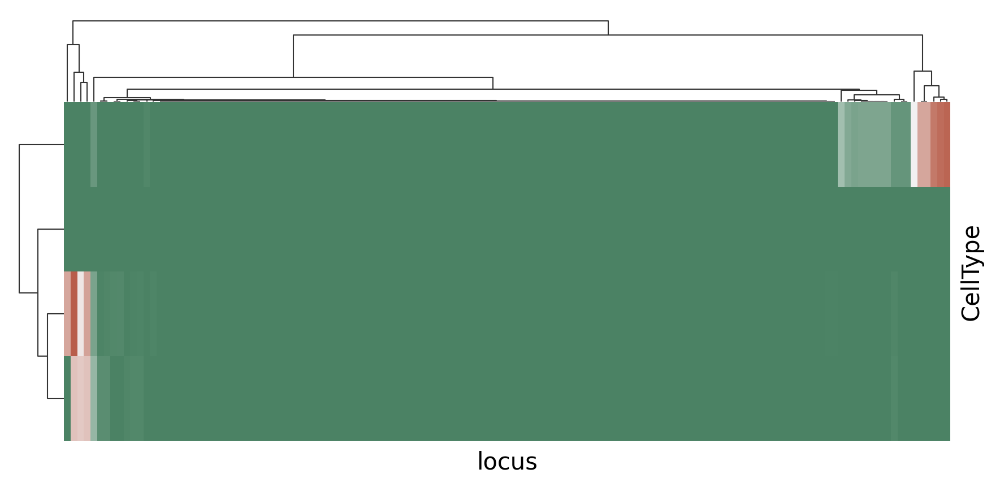

In [78]:
SNV_SummaryByLocus_mut_pivotted = SNV_SummaryByLocus.pivot(columns='locus', index='CellType', values='AlleleFrequency_mut').T.sort_values(['Tumor_2', 'Tumor_0'], )

plt.rcParams["figure.dpi"] = 300
ax = sns.clustermap(SNV_SummaryByLocus_mut_pivotted.T, 
               # cmap=sns.light_palette("darkred", as_cmap=True),
               # cmap=sns.diverging_palette(220, 20, as_cmap=True),
               cmap=sns.diverging_palette(145, 20, s=60, as_cmap=True),
               figsize=(6, 3), 
                dendrogram_ratio=(.05, .2),
               cbar_pos=None,
               **{'robust':False, 
                  # 'cbar':False, 
                  'xticklabels':False, 'yticklabels':False,},
               )

plt.show()

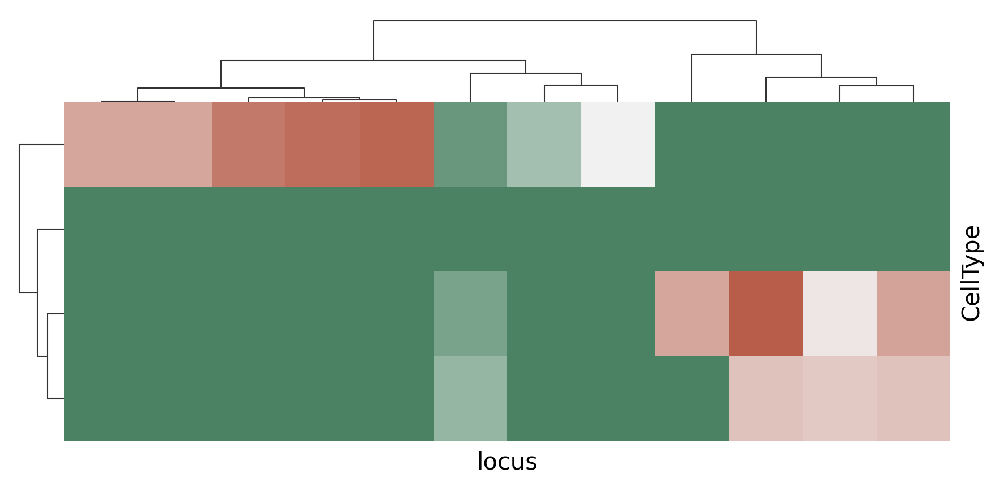

In [95]:
SNV_SummaryByLocus_mut_pivotted = SNV_SummaryByLocus.pivot(columns='locus', index='CellType', values='AlleleFrequency_mut').T.sort_values(['Tumor_2', 'Tumor_0'], )

plt.rcParams["figure.dpi"] = 300
ax = sns.clustermap(SNV_SummaryByLocus_mut_pivotted.T, 
               # cmap=sns.light_palette("darkred", as_cmap=True),
               # cmap=sns.diverging_palette(220, 20, as_cmap=True),
               cmap=sns.diverging_palette(145, 20, s=60, as_cmap=True),
               figsize=(6, 3), 
                dendrogram_ratio=(.05, .2),
               cbar_pos=None,
               **{'robust':False, 
                  # 'cbar':False, 
                  'xticklabels':False, 'yticklabels':False,},
               )

plt.show()

#### UMAP visualization of SNV (Extended Data Fig. 2d) 

chr14_24145385


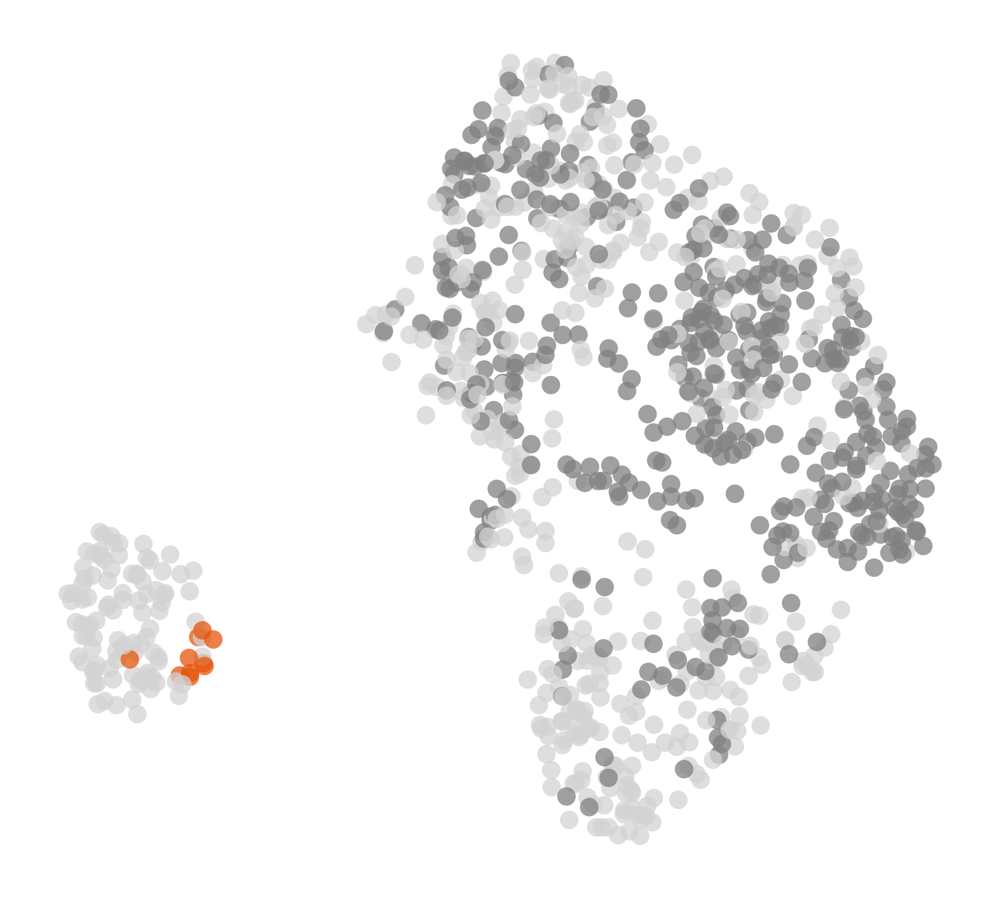

In [114]:
locus_of_interest = 'chr14_24145385'

SingleCellGenotype_Results_filtered_oi = SingleCellGenotype_Results_filtered[(SingleCellGenotype_Results_filtered['locus']==locus_of_interest)]
dict_Identifier_to_BaseObserved = { tup.Identifier : tup.Base_observed for tup in SingleCellGenotype_Results_filtered_oi.itertuples() }
for Identifier, edf in SingleCellGenotype_Results_filtered_oi.groupby('Identifier'):
    if len(edf)==1:
        dict_Identifier_to_BaseObserved[Identifier] = edf.iloc[0].Base_observed
    else:
        REF_ALLELE = edf.iloc[0].REF
        ALT_ALLELE = edf.iloc[0].ALT_expected
        if ALT_ALLELE in list(edf['Base_observed']):
            dict_Identifier_to_BaseObserved[Identifier] = ALT_ALLELE
        else:
            dict_Identifier_to_BaseObserved[Identifier] = REF_ALLELE
        

for Identifier in adata_SC035.obs['Identifier']:
    try: dict_Identifier_to_BaseObserved[Identifier]
    except KeyError: dict_Identifier_to_BaseObserved[Identifier] = 'N/A'

adata_epi_tumor_SC035.obs['SNP_allele'] = [ dict_Identifier_to_BaseObserved[Identifier] for Identifier in adata_epi_tumor_SC035.obs['Identifier'] ]

REF_allele = SingleCellGenotype_Results_filtered_oi.iloc[0].REF.split(',')[0]
ALT_allele = SingleCellGenotype_Results_filtered_oi.iloc[0].ALT_expected.split(',')[0]

print(locus_of_interest)
with plt.rc_context({"figure.dpi": (500), 'figure.figsize':(5, 4.5)},):
       sc.pl.umap(adata_epi_tumor_SC035, 
              color=['SNP_allele',],  #  SComatic_CellType2, 'SNP_allele', 'MSI_score'
              palette={REF_allele : 'gray', 
                       ALT_allele : sns.color_palette('tab20c')[4], 
                       'N/A' : 'lightgray'},
              legend_loc=None,
              colorbar_loc=None,
              alpha=0.75,
              title='',
              frameon=False,
              )

### MSIsensor-pro results of SC035 tumor Leiden clusters (Fig. 2e)

#### Run MSIsensor-pro

In [119]:
DIR_MSISENSOR_PRO_OUT = '/node200data/18parkky/datasets/data/public/processed_data/CRC_MSI_intensity_analysis_clean_data/MSIsensor_SC035'

In [ ]:
dict_SampleID_to_CB_to_subleiden = { SampleID : { f"{tup.Index.split('-')[0]}-1" : tup.TumorCellType for tup in edf.itertuples() } for SampleID, edf in adata_epi_tumor_SC035.obs.groupby('SampleID', observed=True) }

In [ ]:
# Write BAM files that only contain reads from tumor cells
for PATH_BAM in [ PATH_EXT048_BAM, PATH_EXT049_BAM,  ]:
    SampleID = PATH_BAM.split('/')[-3]
    
    bamfile = pysam.AlignmentFile( PATH_BAM, 'rb' )
    dict_Subleiden_to_newBamfile = dict()
    
    for read in bamfile.fetch():
        try:
            CB = read.get_tag('CB')
            try:
                Subleiden = dict_SampleID_to_CB_to_subleiden[SampleID][CB]
                try:
                    dict_Subleiden_to_newBamfile[Subleiden].write( read )
                except KeyError:
                    dict_Subleiden_to_newBamfile[Subleiden] = pysam.AlignmentFile( f'{DIR_MSISENSOR_PRO_OUT}/{SampleID}.{Subleiden}.bam', 'wb', template=bamfile )
            except KeyError:
                continue
        except KeyError: 
            continue 

for subLeiden, bamfile in dict_Subleiden_to_newBamfile.items():
    bamfile.close()

In [ ]:
# Write BAM files that only contain reads from normal cells
dict_SampleID_to_normalCell_CB = dict() 

for SampleID, edf in adata_SC035.obs[~adata_SC035.obs['Identifier'].isin(adata_epi_tumor_SC035.obs['Identifier'])].groupby('SampleID', observed=True):
    dict_SampleID_to_normalCell_CB[SampleID] = set( [ f"{idx.split('-')[0]}-1" for idx in edf.index ] )
    
for PATH_BAM in [ PATH_EXT048_BAM, PATH_EXT049_BAM, PATH_EXT050_BAM, PATH_EXT051_BAM,  ]:
    SampleID = PATH_BAM.split('/')[-3]
    
    bamfile = pysam.AlignmentFile( PATH_BAM, 'rb' )
    newBamfile = pysam.AlignmentFile( f'{DIR_MSISENSOR_PRO_OUT}/{SampleID}.normal.bam', 'wb', template=bamfile )
    for read in bamfile.fetch():
        try:
            CB = read.get_tag("CB")
            if CB in dict_SampleID_to_normalCell_CB[SampleID]:
                newBamfile.write( read )
            else: continue 
        except KeyError:
            continue 
    newBamfile.close()

In [ ]:
# The following commmand were used:
# ~/msisensor-pro msi -d {PATH_TO_HOMOPOLYMER_LIST} -n {PATH_TO_NORMAL_BAM} -t {PATH_TO_TUMOR_BAM} -b 36 -x 1 -y 0

#### Visualize results

In [120]:
PATH_TO_MSISENSOR_OUT_TUMOR_0 = f'{DIR_MSISENSOR_PRO_OUT}/Tumor_0.out'
PATH_TO_MSISENSOR_OUT_TUMOR_1 = f'{DIR_MSISENSOR_PRO_OUT}/Tumor_1.out'
PATH_TO_MSISENSOR_OUT_TUMOR_2 = f'{DIR_MSISENSOR_PRO_OUT}/Tumor_2.out'

MSI_sensor_Tumor_0 = pd.read_csv(PATH_TO_MSISENSOR_OUT_TUMOR_0, sep='\t')
MSI_sensor_Tumor_1 = pd.read_csv(PATH_TO_MSISENSOR_OUT_TUMOR_1, sep='\t')
MSI_sensor_Tumor_2 = pd.read_csv(PATH_TO_MSISENSOR_OUT_TUMOR_2, sep='\t')

In [124]:
MSI_sensor_Tumor_0['Group'] = 'Tumor 0'
MSI_sensor_Tumor_1['Group'] = 'Tumor 1'
MSI_sensor_Tumor_2['Group'] = 'Tumor 2'

MSIsensor_merged = pd.concat( [MSI_sensor_Tumor_0, MSI_sensor_Tumor_1, MSI_sensor_Tumor_2] )
MSIsensor_merged

,Total_Number_of_Sites,Number_of_Unstable_Sites,%,Group
0,2608,969,37.15,Tumor 0
0,1081,389,35.99,Tumor 1
0,781,360,46.09,Tumor 2


/tmp/ipykernel_116274/1576181312.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=MSIsensor_merged,


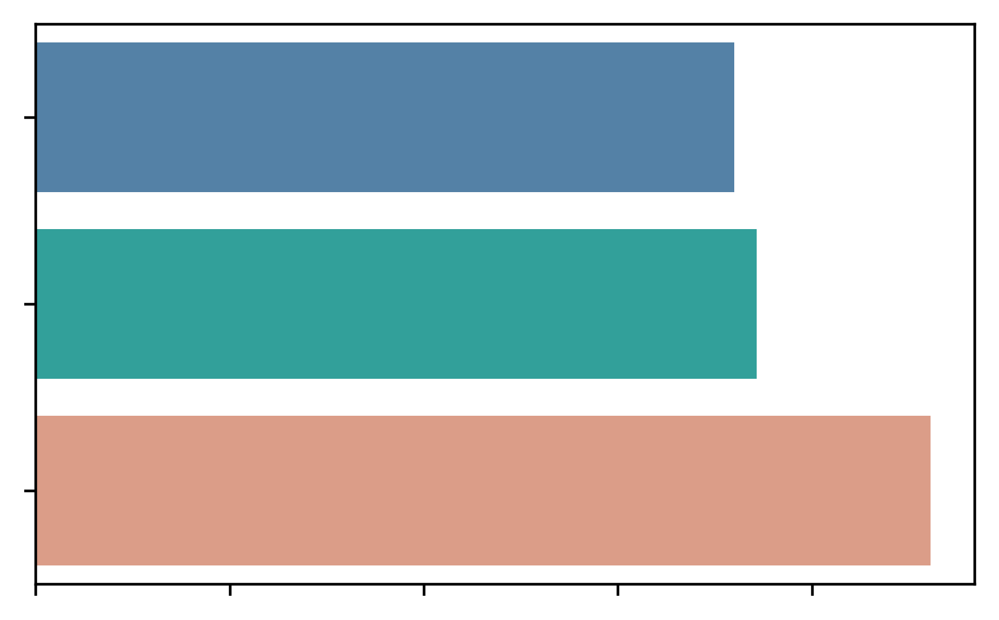

In [125]:
plt.figure(figsize=(5, 3), dpi=400)
ax = sns.barplot(data=MSIsensor_merged, 
                     y='Group', 
                     x='%', 
                     order=['Tumor 1', 'Tumor 0', 'Tumor 2'],
                     palette=['steelblue', 'lightseagreen', 'darksalmon'],
                     )
ax.set_xlabel('');
ax.set_ylabel('');
ax.set_xticklabels([]);
ax.set_yticklabels([]);
plt.show()